# Practice (test_submission1_2, 2_2.csv)
> Public Score
> - test_submission1: 40240.22998
> - test_submission2: 40952.07805

In [131]:
import sys, os

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# column 보기 30개로 설정
pd.set_option('display.max_columns', 30)

In [132]:
# 데이터 경로 설정
file_path = os.path.join(os.getcwd(), 'data')
train_origin = pd.read_csv(file_path+'\dataset.csv')
test_origin = pd.read_csv(file_path+'\problem.csv')

In [133]:
train_origin.shape, test_origin.shape

((1340, 24), (130, 23))

In [134]:
# 전처리를 위한 원본 데이터 복사
train = train_origin.copy()
test = test_origin.copy()

In [135]:
# 메모리를 효율적으로 사용하기 위한 downcast 함수 정의
def downcast(df, verbose=True):     # verbose 옵션 추가: (True)인 경우 몇 퍼센트 압축됐는지 출력
    start_mem = df.memory_usage().sum() / 1024**2   # 초기 메모리 사용량
    for col in df.columns:
        dtype_name = df[col].dtype.name
        if dtype_name == 'object':
            pass
        elif dtype_name == 'bool':
            df[col] = df[col].astype('int8')
        elif dtype_name.startswith('int') or (df[col].round() == df[col]).all():
            df[col] = pd.to_numeric(df[col], downcast='integer')
        else:
            df[col] = pd.to_numeric(df[col], downcast='float')
    end_mem = df.memory_usage().sum() / 1024**2

    if verbose:
        print(f'{(100*(start_mem - end_mem) / start_mem):.1f}% 압축됨')

    return df

In [136]:
downcast(train)
downcast(test)

67.2% 압축됨
68.7% 압축됨


,Id,LotArea,Street,LotConfig,OverallQual,OverallCond,YearBuilt,YearRemodAdd,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageType,GarageYrBlt,GarageCars,GarageArea,YrSold
0,1341,11200,Pave,Inside,5,5,1965,1965,1040,1040,0,1040,1,0,3,1,5,0,Detchd,1965,1,384,2008
1,1342,7200,Pave,Corner,5,7,1951,2000,900,900,0,900,1,0,3,1,5,0,Detchd,2005,2,576,2010
2,1343,16905,Pave,Inside,5,6,1959,1959,1350,1328,0,1328,1,1,2,1,5,2,Attchd,1959,1,308,2007
3,1344,9180,Pave,CulDSac,5,7,1983,1983,840,884,0,884,1,0,2,1,5,0,Attchd,1983,2,504,2007
4,1345,7200,Pave,Inside,5,7,1920,1996,530,581,530,1111,1,0,3,1,6,0,Detchd,1935,1,288,2007
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125,1466,11478,Pave,Inside,8,5,2007,2008,1704,1704,0,1704,2,0,3,1,7,1,Attchd,2008,3,772,2010
126,1467,16321,Pave,CulDSac,5,6,1957,1997,1484,1600,0,1600,1,0,2,1,6,2,Attchd,1957,1,319,2006
127,1468,6324,Pave,Inside,4,6,1927,1950,520,520,0,520,1,0,1,1,4,0,Detchd,1920,1,240,2008
128,1469,8500,Pave,Inside,4,4,1920,1950,649,649,668,1317,1,0,3,1,6,0,Detchd,1920,1,250,2008


# 전처리

### 결측치 처리

In [137]:
train.isnull().sum()

Id               0
LotArea          0
Street           0
LotConfig        0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
TotalBsmtSF      0
1stFlrSF         0
2ndFlrSF         0
GrLivArea        0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
TotRmsAbvGrd     0
Fireplaces       0
GarageType      81
GarageYrBlt     81
GarageCars       0
GarageArea       0
YrSold           0
SalePrice        0
dtype: int64

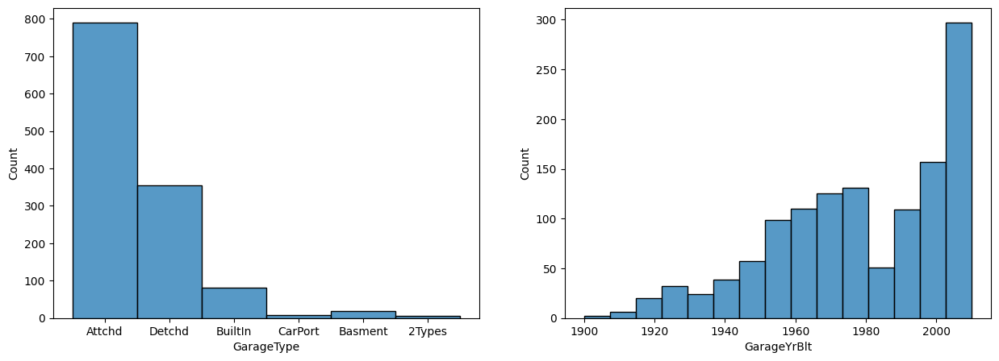

In [138]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)    # 히스토그램
sns.histplot(train['GarageType'])

plt.subplot(1, 2, 2)    # 히스토그램
sns.histplot(train['GarageYrBlt'])

plt.show()

In [139]:
# 최빈값 대체
train['GarageType'].fillna(train['GarageType'].mode()[0], inplace=True)
train['GarageYrBlt'].fillna(train['GarageYrBlt'].mode()[0], inplace=True)

In [140]:
train.isnull().sum().sum(), test.isnull().sum().sum()

(0, 0)

### Feature engineering

In [141]:
train['YearBuilt'].max()      # 최신에 지어진 건물 연도 확인

2010

In [142]:
# 2011년을 기준으로 건물이 지어진 후 지난 시간(연)
train['YearBuiltDiff'] = 2011 - train['YearBuilt']
test['YearBuiltDiff'] = 2011 - test['YearBuilt']

In [143]:
train['YearRemodAdd'].max()     # 리모델링 연도 확인

2010

In [144]:
# 리모델링 여부 및 리모델링 후 지난 시간(연)
train['RemodAddDiff'] = 2011 - train['YearRemodAdd']
train['WhetherRemod'] = (train['RemodAddDiff'] != train['YearBuiltDiff']).astype(int)

test['RemodAddDiff'] = 2011 - test['YearRemodAdd']
test['WhetherRemod'] = (test['RemodAddDiff'] != test['YearBuiltDiff']).astype(int)

In [145]:
# 차고가 지어진 연도 차이
train['NotGarageYr'] = train['GarageYrBlt']- train['YearBuilt']
test['NotGarageYr'] = test['GarageYrBlt'] - test['YearBuilt']

In [146]:
train[train['NotGarageYr'] < 0]     # 일부 0이 나타나내..?

,Id,LotArea,Street,LotConfig,OverallQual,OverallCond,YearBuilt,YearRemodAdd,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageType,GarageYrBlt,GarageCars,GarageArea,YrSold,SalePrice,YearBuiltDiff,RemodAddDiff,WhetherRemod,NotGarageYr
77,78,7200,Pave,Corner,6,6,1910,1998,1214,1260,1031,2291,2,0,4,2,9,1,Detchd,1900.0,2,506,2007,133900,101,13,1,-10.0
289,290,11275,Pave,Corner,7,7,1967,2007,710,1898,1080,2978,2,1,5,1,11,1,BuiltIn,1961.0,2,564,2010,242000,44,4,1,-6.0
543,544,10927,Pave,Inside,8,5,2005,2005,1058,1058,846,1904,2,1,3,1,8,1,BuiltIn,2003.0,2,736,2006,275000,6,6,0,-2.0
556,557,8402,Pave,Inside,5,5,2007,2007,1120,1120,0,1120,1,0,3,1,6,0,Attchd,2005.0,0,0,2007,147000,4,4,0,-2.0
674,675,8544,Pave,Inside,3,4,1950,1950,0,1040,0,1040,2,0,2,2,6,0,Detchd,1949.0,2,400,2006,93500,61,61,0,-1.0
1032,1033,8910,Pave,Corner,6,6,1959,1959,655,1194,0,1194,1,0,3,1,6,1,BuiltIn,1954.0,2,539,2006,159500,52,52,0,-5.0
1269,1270,6292,Pave,Inside,6,5,1930,1950,768,790,0,790,1,0,2,1,4,0,Detchd,1925.0,1,160,2008,91000,81,61,1,-5.0
1301,1302,13053,Pave,Inside,6,7,1923,2000,833,1053,795,1848,1,1,4,1,8,1,Detchd,1922.0,2,370,2008,207000,88,11,1,-1.0
1305,1306,9204,Pave,Inside,5,5,1963,1963,1144,1144,0,1144,1,1,3,1,6,0,Detchd,1962.0,1,336,2008,124000,48,48,0,-1.0
1331,1332,17217,Pave,Inside,5,5,2006,2006,1140,1140,0,1140,1,0,3,1,6,0,Attchd,2005.0,0,0,2006,84500,5,5,0,-1.0


In [147]:
# 음수 값은 0으로 대체
train.loc[train['NotGarageYr'] < 0, 'NotGarageYr'] = 0
test.loc[test['NotGarageYr'] < 0, 'NotGarageYr'] = 0

### 일부 feature 제거

In [148]:
no_use_features = ['Id', 'YrSold', 'YearBuilt', 'YearRemodAdd', 'GarageArea', 'TotRmsAbvGrd', 'GarageYrBlt', 'TotalBsmtSF']
# 1stFlrSF, 2stFlrSF, BedroomAbvGr, FullBath도 고려

In [149]:
train.drop(no_use_features, axis=1, inplace=True)
test.drop(no_use_features, axis=1, inplace=True)

### 중복 데이터 제거

In [150]:
train.duplicated().sum()    # 중복 데이터 확인

2

In [151]:
train = train.drop_duplicates()     # 중복 데이터 제거

### 이상치 처리
> target 값인 SalePrice와 그와 상관관계가 매우 높은 몇 가지 feature만 이상치 처리를 좀 해주자.

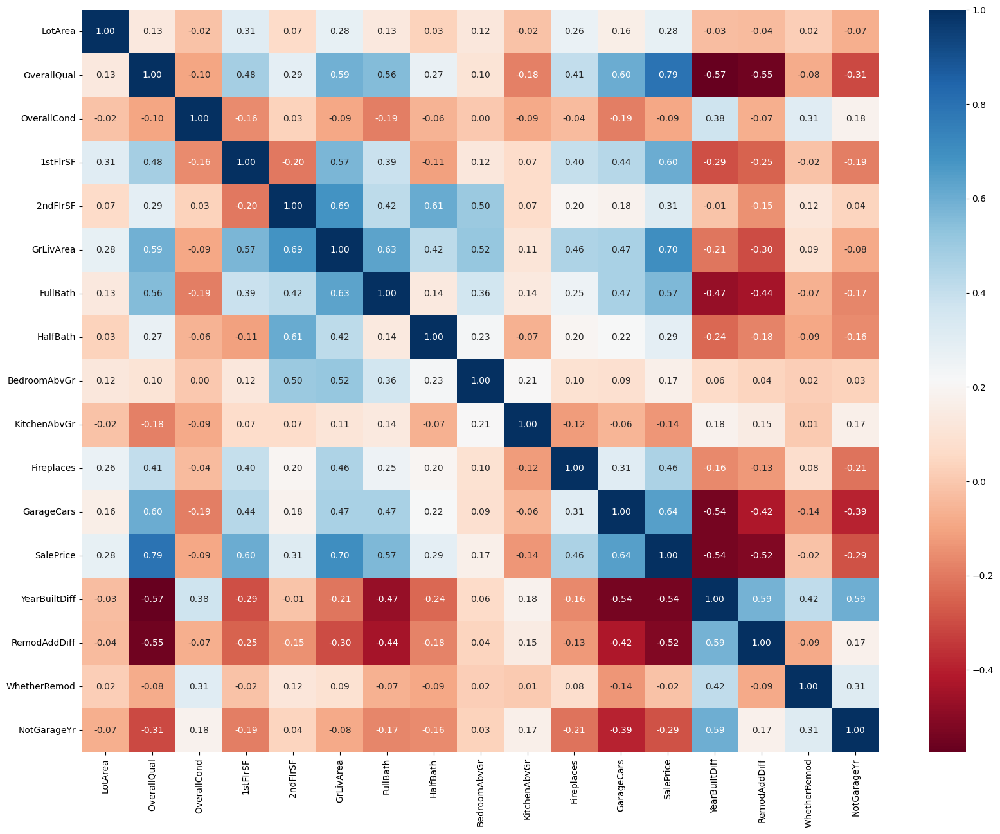

In [152]:
# 상관계수 히트맵
numeric_data = train.select_dtypes(exclude="object")   # 수치형 데이터만 추출
plt.figure(figsize=(20, 15))
sns.heatmap(numeric_data.corr(), annot=True, fmt='.2f', cmap='RdBu')    # cmap: 색상  # 절반만 표시하고 싶은 경우 mask=mask 옵션 추가
plt.show()

In [153]:
len(train.columns)

20

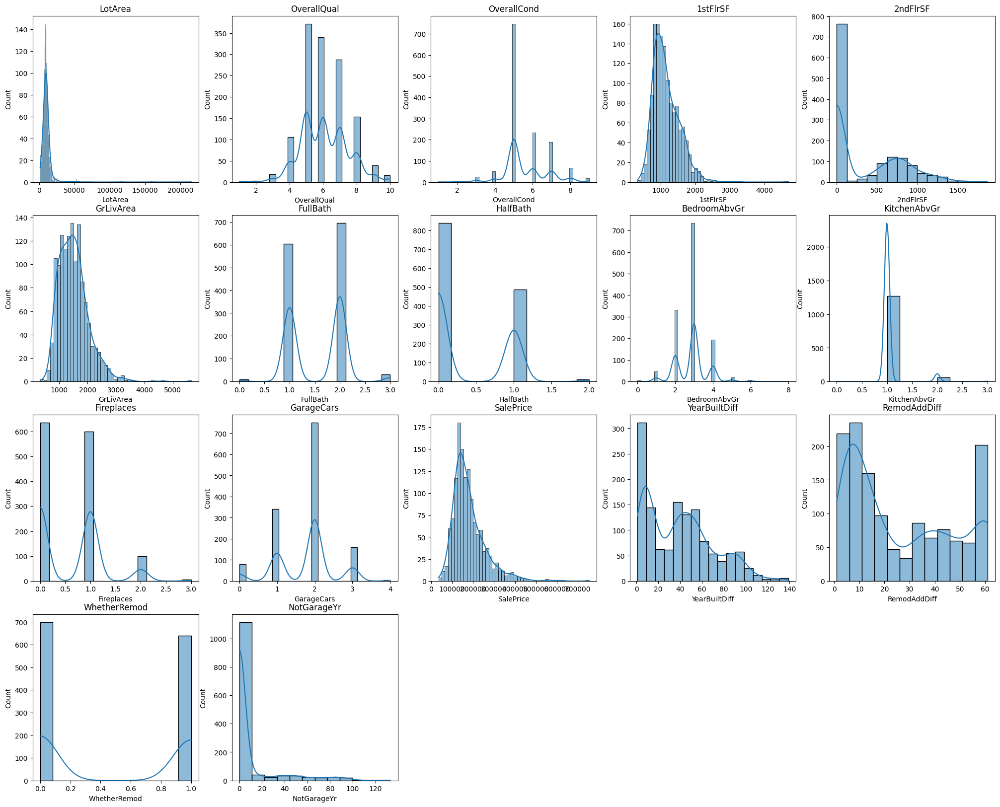

In [154]:
# 모든 수치형 변수의 히스토그램 한 번에 시각화
plt.figure(figsize=(25, 20))
for i, col in enumerate(numeric_data.columns):
    plt.subplot(4, 5, i+1)
    sns.histplot(train[col], kde=True)
    plt.title(col)

> LotArea

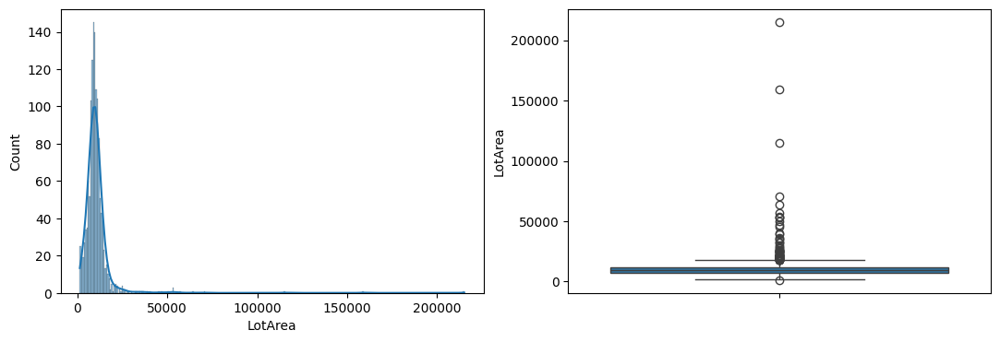

In [155]:
# 히스토그램
plt.figure(figsize=(13, 4))
plt.subplot(1, 2, 1)
sns.histplot(train['LotArea'], kde=True)

# 박스플롯
plt.subplot(1, 2, 2)
sns.boxplot(train['LotArea'])
plt.show()

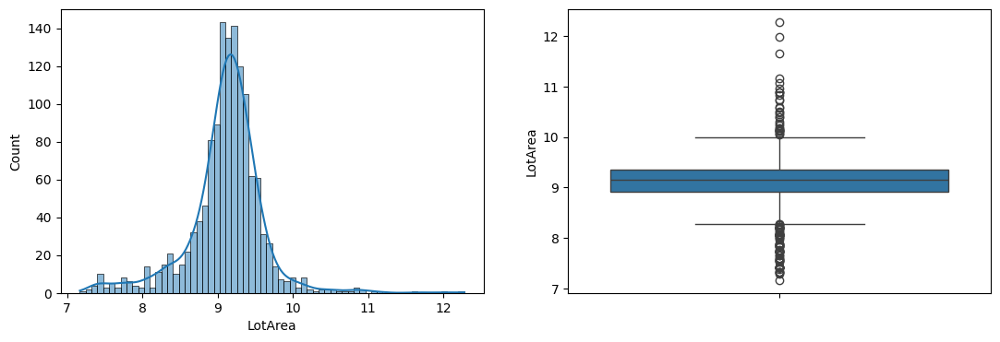

In [156]:
# LotArea의 log 변환
plt.figure(figsize=(13, 4))
plt.subplot(1, 2, 1)
sns.histplot(np.log1p(train['LotArea']), kde=True)

plt.subplot(1, 2, 2)
sns.boxplot(np.log1p(train['LotArea']))
plt.show()

In [157]:
train = train[train['LotArea']<100000].reset_index(drop=True)    # LotArea 이상치 처리(임의)

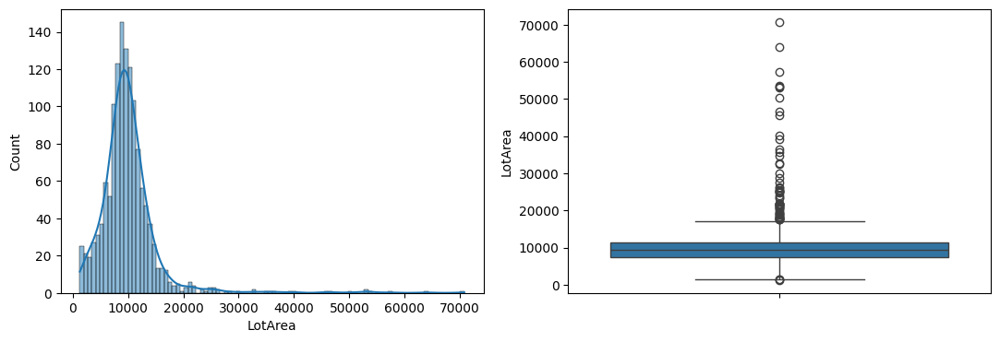

In [158]:
# 히스토그램
plt.figure(figsize=(13, 4))
plt.subplot(1, 2, 1)
sns.histplot(train['LotArea'], kde=True)

# 박스플롯
plt.subplot(1, 2, 2)
sns.boxplot(train['LotArea'])
plt.show()

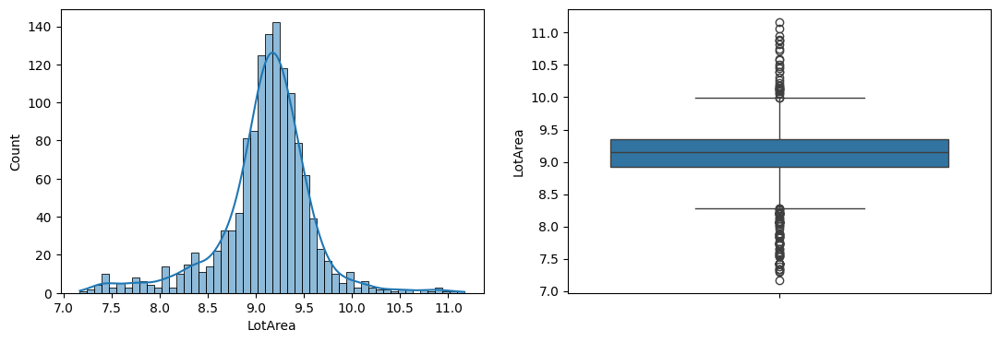

In [159]:
# LotArea의 log 변환
plt.figure(figsize=(13, 4))
plt.subplot(1, 2, 1)
sns.histplot(np.log1p(train['LotArea']), kde=True)

plt.subplot(1, 2, 2)
sns.boxplot(np.log1p(train['LotArea']))
plt.show()

> SalePrice

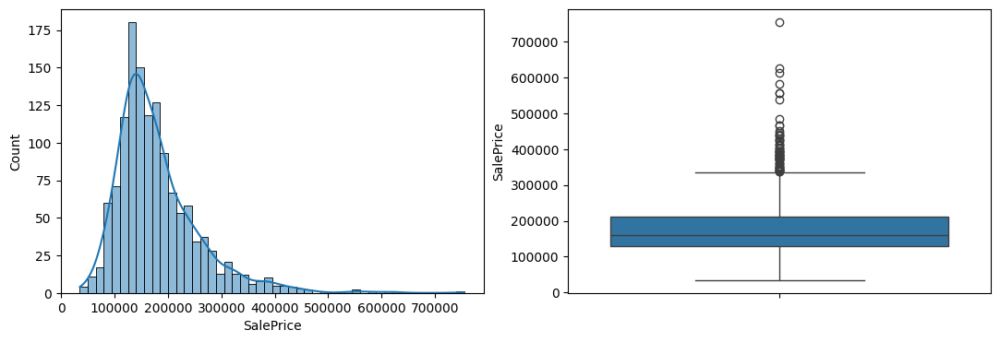

In [160]:
# 히스토그램
plt.figure(figsize=(13, 4))
plt.subplot(1, 2, 1)
sns.histplot(train['SalePrice'], kde=True)

# 박스플롯
plt.subplot(1, 2, 2)
sns.boxplot(train['SalePrice'])
plt.show()

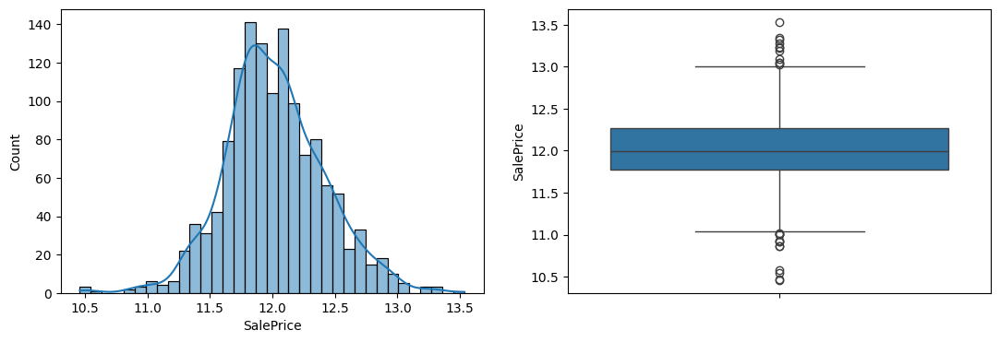

In [161]:
# SalePrice의 log 변환
plt.figure(figsize=(13, 4))
plt.subplot(1, 2, 1)
sns.histplot(np.log1p(train['SalePrice']), kde=True)

plt.subplot(1, 2, 2)
sns.boxplot(np.log1p(train['SalePrice']))
plt.show()

In [162]:
train = train[train['SalePrice'] < 600000].reset_index(drop=True)    # SalePrice의 이상치 처리(임의)

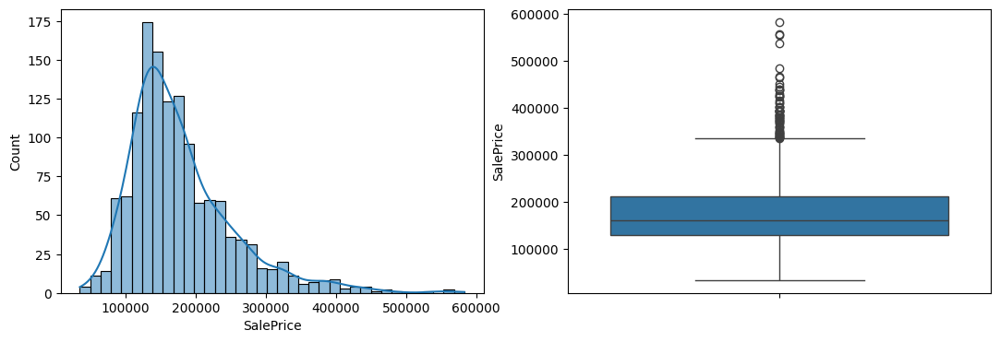

In [163]:
# 히스토그램
plt.figure(figsize=(13, 4))
plt.subplot(1, 2, 1)
sns.histplot(train['SalePrice'], kde=True)

# 박스플롯
plt.subplot(1, 2, 2)
sns.boxplot(train['SalePrice'])
plt.show()

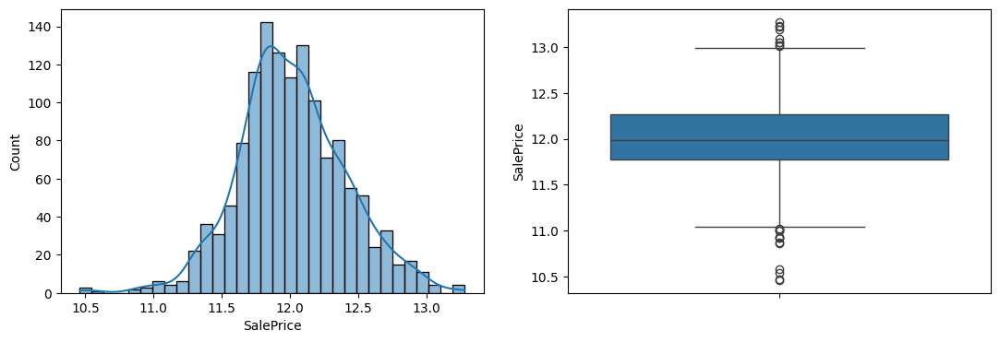

In [164]:
# SalePrice의 log 변환
plt.figure(figsize=(13, 4))
plt.subplot(1, 2, 1)
sns.histplot(np.log1p(train['SalePrice']), kde=True)

plt.subplot(1, 2, 2)
sns.boxplot(np.log1p(train['SalePrice']))
plt.show()

> GrLivArea

In [165]:
temp = train[train['GrLivArea']<4000]

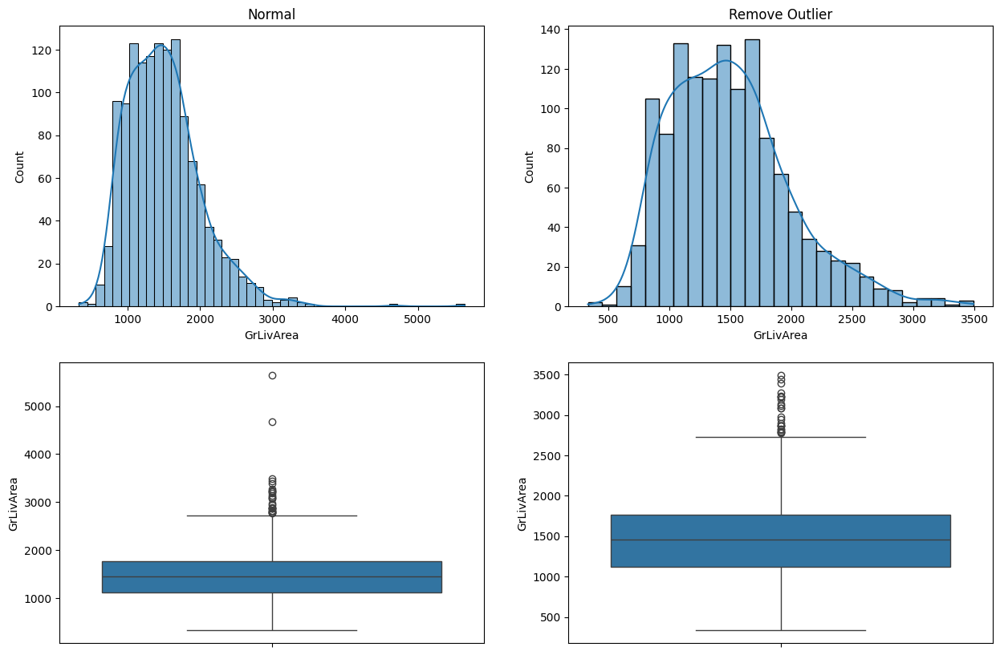

In [166]:
# 히스토그램
plt.figure(figsize=(15, 10))
plt.subplot(2, 2, 1)
sns.histplot(train['GrLivArea'], kde=True)
plt.title("Normal")

# 히스토그램
plt.subplot(2, 2, 2)
sns.histplot(temp['GrLivArea'], kde=True)
plt.title("Remove Outlier")

# 박스플롯
plt.subplot(2, 2, 3)
sns.boxplot(train['GrLivArea'])

# 박스플롯
plt.subplot(2, 2, 4)
sns.boxplot(temp['GrLivArea'])

plt.show()

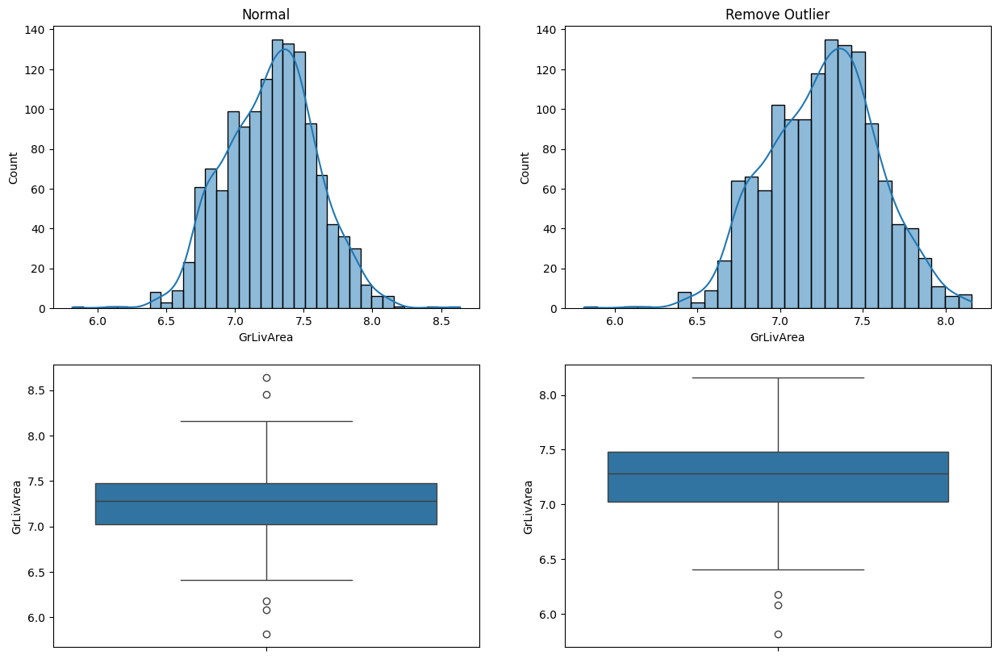

In [167]:
# GrLivArea의 log 변환
plt.figure(figsize=(15, 10))
plt.subplot(2, 2, 1)
sns.histplot(np.log1p(train['GrLivArea']), kde=True)
plt.title("Normal")

plt.subplot(2, 2, 2)
sns.histplot(np.log1p(temp['GrLivArea']), kde=True)
plt.title("Remove Outlier")

plt.subplot(2, 2, 3)
sns.boxplot(np.log1p(train['GrLivArea']))

plt.subplot(2, 2, 4)
sns.boxplot(np.log1p(temp['GrLivArea']))

plt.show()

### Encoding

In [168]:
# X, y 분리
X_train = train.drop(columns='SalePrice', axis=1)
y_train = train['SalePrice']

In [169]:
# 범주형 변수 OHE
categorical = X_train.select_dtypes(include='object').columns

all_data = pd.concat([X_train, test], sort=False)

all_data = pd.get_dummies(all_data, columns=categorical)

X_train_encoded = all_data[:len(X_train)]
test_encoded = all_data[len(X_train):]

In [170]:
X_train_encoded.shape, test_encoded.shape

((1332, 29), (130, 29))

In [171]:
# 수치형 변수들 Standardization
from sklearn.preprocessing import StandardScaler

#numerical = X_train.select_dtypes(exclude='object').columns

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_encoded)
test_scaled = scaler.transform(test_encoded)

In [110]:
X_train_scaled.shape, y_train.shape

((1332, 29), (1332,))

# Model training

### XGBoost

In [179]:
# cross_val_score를 이용한 교차검증
from sklearn.model_selection import cross_val_score
from xgboost import XGBRegressor

def rmse_cv(model):
    rmse = np.sqrt(-cross_val_score(model, X_train_scaled, y_train, scoring='neg_mean_squared_error', cv=5))
    return rmse, rmse.mean()

params = {
    'n_estimators': 500,
    'max_depth': 7,
    'max_leaves': 200,
    'min_child_weight': 6,
    'learning_rate': 0.1,
    'gamma': 3.85,
}

xgb_model = XGBRegressor(**params, random_state=42)
score, mean_score = rmse_cv(xgb_model)
score

array([25464.94857931, 33660.93648075, 32548.94679795, 24105.81320868,
       29900.92297297])

In [181]:
# 베이지안 최적화
from sklearn.model_selection import cross_val_score
from xgboost import XGBRegressor

def rmse_cv(model):
    rmse = np.sqrt(-cross_val_score(model, X_train_scaled, y_train, scoring='neg_mean_squared_error', cv=5))
    return rmse, rmse.mean()

param_bounds = {
    'learning_rate' : (0.001, 0.5),
    'max_leaves': (2, 1024),
    'n_estimators': (100, 1000),
    'gamma': (0, 10),
    'max_depth': (3, 15),
    'min_child_weight': (1, 10),
    }

def eval_function(max_leaves, learning_rate, n_estimators, gamma, max_depth, min_child_weight):
    params = {
        'learning_rate' : learning_rate, 
        'max_leaves': int(max_leaves),
        'n_estimators': int(n_estimators),
        'gamma': gamma,
        'max_depth': int(max_depth),
        'min_child_weight': min_child_weight,
    }

    xgb_model = XGBRegressor(**params, random_state=42)
    score, mean_score = rmse_cv(xgb_model)
    return -mean_score

In [182]:
from bayes_opt import BayesianOptimization

optimizer = BayesianOptimization(f=eval_function, pbounds=param_bounds, random_state=42)
optimizer.maximize(init_points=5, n_iter=50)

|   iter    |  target   |   gamma   | learni... | max_depth | max_le... | min_ch... | n_esti... |
-------------------------------------------------------------------------------------------------
| 1         | -3.16e+04 | 3.745     | 0.4754    | 11.78     | 613.8     | 2.404     | 240.4     |
| 2         | -3.083e+0 | 0.5808    | 0.4332    | 10.21     | 725.7     | 1.185     | 972.9     |
| 3         | -2.818e+0 | 8.324     | 0.107     | 5.182     | 189.4     | 3.738     | 572.3     |
| 4         | -2.979e+0 | 4.319     | 0.1463    | 10.34     | 144.6     | 3.629     | 429.7     |
| 5         | -3.04e+04 | 4.561     | 0.3928    | 5.396     | 527.5     | 6.332     | 141.8     |
| 6         | -3.04e+04 | 8.893     | 0.3859    | 7.938     | 189.9     | 9.473     | 579.1     |
| 7         | -3.006e+0 | 1.242     | 0.3566    | 11.89     | 161.9     | 6.704     | 896.4     |
| 8         | -3.111e+0 | 2.104     | 0.4963    | 5.567     | 718.5     | 5.461     | 358.9     |
| 9         | -2.997

In [202]:
# 최적화된 하이퍼파라미터로 모델 재학습
best_params = {
    'n_estimators': round(optimizer.max['params']['n_estimators']),
    'max_depth': round(optimizer.max['params']['max_depth']),
    'max_leaves': round(optimizer.max['params']['max_leaves']),
    'min_child_weight': round(optimizer.max['params']['min_child_weight']),
    'learning_rate': optimizer.max['params']['learning_rate'],
    'gamma': optimizer.max['params']['gamma'],
}

best_xgb = XGBRegressor(**best_params, random_state=42)
score, mean_score = rmse_cv(best_xgb)
print(score)
print(mean_score)

[26344.46275362 24807.77131835 28564.81580213 36723.62942689
 31126.23102405 32463.79108451 19360.64039094 25285.51151011
 25398.84289578 31118.01797604]
28119.371418242157


In [185]:
best_xgb.fit(X_train_scaled, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=3.3996882978156204, gpu_id=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.1351269231175033, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=4, max_leaves=987,
             min_child_weight=8, missing=nan, monotone_constraints=None,
             n_estimators=168, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=42, ...)

In [186]:
# 모델의 결정계수 확인
from sklearn.metrics import r2_score
y_pred = best_xgb.predict(X_train_scaled)

r2_score(y_pred, y_train)

0.9662735266771977

### LightGBM

In [188]:
# 베이지안 최적화
from sklearn.model_selection import cross_val_score
from lightgbm import LGBMRegressor

def rmse_cv(model):
    rmse = np.sqrt(-cross_val_score(model, X_train_scaled, y_train, scoring='neg_mean_squared_error', cv=10))
    return rmse, rmse.mean()

param_bounds = {
    'n_estimators': (100, 1000),
    'max_depth': (3, 15),
    'num_leaves': (20, 300),
    'min_child_samples': (10, 30),
    'learning_rate': (0.001, 0.5),
}

def eval_function(n_estimators, max_depth, num_leaves, min_child_samples, learning_rate):
    params = {
        'n_estimators': int(n_estimators),
        'max_depth': int(max_depth),
        'num_leaves': int(num_leaves),
        'min_child_samples': int(min_child_samples),
        'learning_rate': learning_rate,
    }

    lgbm = LGBMRegressor(**params, metric='RMSE', random_state=42, verbose=0)
    score, mean_score = rmse_cv(lgbm)
    return -mean_score

In [189]:
from bayes_opt import BayesianOptimization

lgbm_optimizer = BayesianOptimization(f=eval_function, pbounds=param_bounds, random_state=42)
lgbm_optimizer.maximize(init_points=5, n_iter=50)

|   iter    |  target   | learni... | max_depth | min_ch... | n_esti... | num_le... |
-------------------------------------------------------------------------------------
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

In [197]:
# 최적화된 하이퍼파라미터로 모델 재학습
best_params = {
    'n_estimators': round(lgbm_optimizer.max['params']['n_estimators']),
    'max_depth': round(lgbm_optimizer.max['params']['max_depth']),
    'num_leaves': round(lgbm_optimizer.max['params']['num_leaves']),
    'min_child_samples': round(lgbm_optimizer.max['params']['min_child_samples']),
    'learning_rate': lgbm_optimizer.max['params']['learning_rate'],
}

best_lgbm = LGBMRegressor(**best_params, metric='RMSE', random_state=42, verbose=0)
score, mean_score = rmse_cv(best_lgbm)
print(score, mean_score)

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [192]:
best_lgbm.fit(X_train_scaled, y_train)

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LGBMRegressor(learning_rate=0.07884126564776513, max_depth=4, metric='RMSE',
              min_child_samples=27, n_estimators=641, num_leaves=218,
              random_state=42, verbose=0)

In [193]:
# 모델의 결정계수 확인
from sklearn.metrics import r2_score
y_pred = best_lgbm.predict(X_train_scaled)

r2_score(y_pred, y_train)

0.9602030941194166

# 결과 제출

In [195]:
# submission 파일 생성
submission_origin = pd.read_csv(file_path+'\submission.csv')
submission = submission_origin.copy()

In [196]:
# 최종 모델(XGBRegressor)로 test set 예측
xgb_pred = best_xgb.predict(test_scaled)
lgbm_pred = best_lgbm.predict(test_scaled)

submission['SalePrice'] = xgb_pred
submission.to_csv('test_submission1_2.csv', index=False)

submission['SalePrice'] = lgbm_pred
submission.to_csv('test_submission2_2.csv', index=False)